<a href="https://colab.research.google.com/github/Shazma-Aslam/ML_projects/blob/main/gan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
import os
from glob import glob
from PIL import Image
import matplotlib.pyplot as plt

# Constants
IMG_HEIGHT = 640
IMG_WIDTH = 640
CHANNELS = 3
BATCH_SIZE = 16
EPOCHS = 1500


In [ ]:
def load_image(file_path):
    image = tf.io.read_file(file_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [IMG_HEIGHT, IMG_WIDTH])
    image = (tf.cast(image, tf.float32) - 127.5) / 127.5  # Normalize to [-1, 1]
    return image

image_paths = glob('./dataset/*.jpg')  # or .png

dataset = tf.data.Dataset.from_tensor_slices(image_paths)
dataset = dataset.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
dataset = dataset.shuffle(buffer_size=1000).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)


In [ ]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(80 * 80 * 256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((80, 80, 256)))
    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))

    return model


In [ ]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[IMG_HEIGHT, IMG_WIDTH, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1))

    return model


In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

generator = make_generator_model()
discriminator = make_discriminator_model()

generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, 100])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss


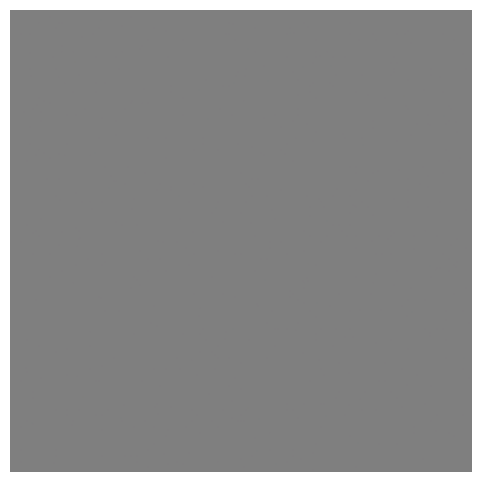

Epoch 1, Gen Loss: 0.6850, Disc Loss: 1.5006, Time: 12.16s
Epoch 2, Gen Loss: 3.6796, Disc Loss: 0.0268, Time: 0.97s
Epoch 3, Gen Loss: 5.8238, Disc Loss: 0.0032, Time: 0.97s
Epoch 4, Gen Loss: 6.7465, Disc Loss: 0.0013, Time: 0.98s
Epoch 5, Gen Loss: 6.6058, Disc Loss: 0.0016, Time: 0.97s
Epoch 6, Gen Loss: 6.1047, Disc Loss: 0.0025, Time: 0.98s
Epoch 7, Gen Loss: 5.3626, Disc Loss: 0.0051, Time: 0.98s
Epoch 8, Gen Loss: 4.6579, Disc Loss: 0.0100, Time: 0.98s
Epoch 9, Gen Loss: 4.8373, Disc Loss: 0.0087, Time: 0.98s
Epoch 10, Gen Loss: 5.4263, Disc Loss: 0.0050, Time: 0.98s
Epoch 11, Gen Loss: 6.6399, Disc Loss: 0.0015, Time: 0.98s
Epoch 12, Gen Loss: 8.0501, Disc Loss: 0.0004, Time: 0.98s
Epoch 13, Gen Loss: 9.2923, Disc Loss: 0.0001, Time: 0.98s
Epoch 14, Gen Loss: 10.1741, Disc Loss: 0.0000, Time: 0.99s
Epoch 15, Gen Loss: 10.9000, Disc Loss: 0.0000, Time: 0.99s
Epoch 16, Gen Loss: 11.2368, Disc Loss: 0.0000, Time: 0.98s
Epoch 17, Gen Loss: 11.6254, Disc Loss: 0.0000, Time: 0.99s
E

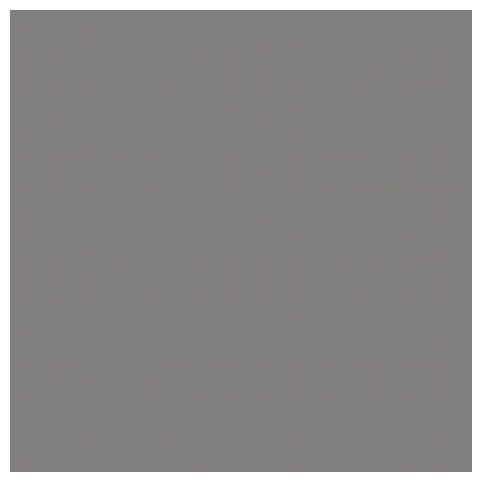

Epoch 51, Gen Loss: 9.2278, Disc Loss: 0.0001, Time: 1.27s
Epoch 52, Gen Loss: 9.3945, Disc Loss: 0.0001, Time: 1.03s
Epoch 53, Gen Loss: 9.5257, Disc Loss: 0.0001, Time: 1.01s
Epoch 54, Gen Loss: 9.5704, Disc Loss: 0.0001, Time: 1.01s
Epoch 55, Gen Loss: 9.4163, Disc Loss: 0.0001, Time: 1.01s
Epoch 56, Gen Loss: 9.1751, Disc Loss: 0.0001, Time: 1.01s
Epoch 57, Gen Loss: 9.0412, Disc Loss: 0.0002, Time: 1.01s
Epoch 58, Gen Loss: 8.8366, Disc Loss: 0.0002, Time: 1.00s
Epoch 59, Gen Loss: 8.6956, Disc Loss: 0.0002, Time: 1.00s
Epoch 60, Gen Loss: 8.6122, Disc Loss: 0.0002, Time: 1.00s
Epoch 61, Gen Loss: 8.7376, Disc Loss: 0.0002, Time: 1.00s
Epoch 62, Gen Loss: 8.7614, Disc Loss: 0.0002, Time: 1.00s
Epoch 63, Gen Loss: 8.8014, Disc Loss: 0.0002, Time: 1.00s
Epoch 64, Gen Loss: 8.7675, Disc Loss: 0.0002, Time: 1.00s
Epoch 65, Gen Loss: 8.8075, Disc Loss: 0.0002, Time: 1.01s
Epoch 66, Gen Loss: 8.7301, Disc Loss: 0.0003, Time: 1.00s
Epoch 67, Gen Loss: 8.7155, Disc Loss: 0.0002, Time: 0.9

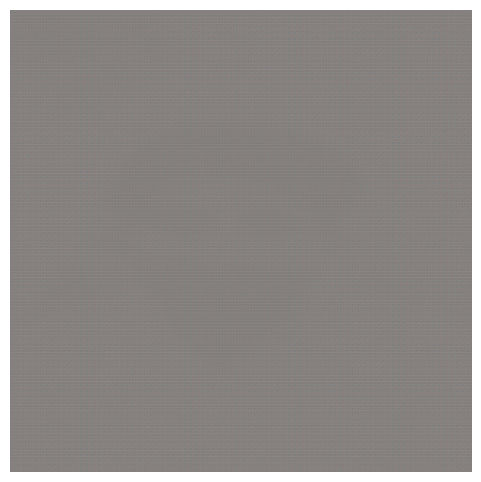

Epoch 101, Gen Loss: 8.9191, Disc Loss: 0.0002, Time: 1.21s
Epoch 102, Gen Loss: 8.9579, Disc Loss: 0.0002, Time: 0.99s
Epoch 103, Gen Loss: 8.8861, Disc Loss: 0.0002, Time: 0.99s
Epoch 104, Gen Loss: 8.7285, Disc Loss: 0.0003, Time: 0.99s
Epoch 105, Gen Loss: 8.6994, Disc Loss: 0.0003, Time: 0.99s
Epoch 106, Gen Loss: 8.7312, Disc Loss: 0.0003, Time: 0.99s
Epoch 107, Gen Loss: 8.8965, Disc Loss: 0.0003, Time: 0.99s
Epoch 108, Gen Loss: 8.8515, Disc Loss: 0.0003, Time: 0.99s
Epoch 109, Gen Loss: 8.9918, Disc Loss: 0.0003, Time: 0.99s
Epoch 110, Gen Loss: 8.9371, Disc Loss: 0.0003, Time: 0.99s
Epoch 111, Gen Loss: 8.9237, Disc Loss: 0.0003, Time: 0.99s
Epoch 112, Gen Loss: 8.9547, Disc Loss: 0.0003, Time: 1.01s
Epoch 113, Gen Loss: 8.8897, Disc Loss: 0.0003, Time: 1.00s
Epoch 114, Gen Loss: 8.7749, Disc Loss: 0.0004, Time: 1.00s
Epoch 115, Gen Loss: 8.5482, Disc Loss: 0.0004, Time: 0.99s
Epoch 116, Gen Loss: 8.8877, Disc Loss: 0.0003, Time: 1.00s
Epoch 117, Gen Loss: 9.3012, Disc Loss: 

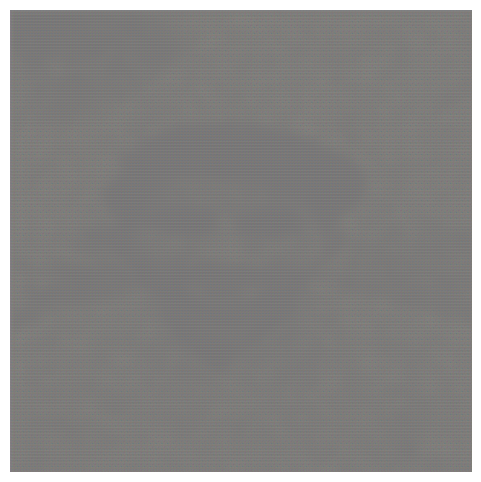

Epoch 151, Gen Loss: 32.4533, Disc Loss: 1.2779, Time: 1.20s
Epoch 152, Gen Loss: 33.3458, Disc Loss: 0.0636, Time: 1.00s
Epoch 153, Gen Loss: 32.8123, Disc Loss: 0.0004, Time: 1.00s
Epoch 154, Gen Loss: 30.7717, Disc Loss: 0.0000, Time: 1.00s
Epoch 155, Gen Loss: 29.3130, Disc Loss: 0.0000, Time: 1.00s
Epoch 156, Gen Loss: 26.8629, Disc Loss: 0.0000, Time: 0.99s
Epoch 157, Gen Loss: 23.8740, Disc Loss: 0.0000, Time: 0.99s
Epoch 158, Gen Loss: 20.9249, Disc Loss: 0.0000, Time: 0.99s
Epoch 159, Gen Loss: 17.6109, Disc Loss: 0.0000, Time: 0.99s
Epoch 160, Gen Loss: 14.7184, Disc Loss: 0.0000, Time: 1.00s
Epoch 161, Gen Loss: 11.4160, Disc Loss: 0.0000, Time: 1.00s
Epoch 162, Gen Loss: 8.2767, Disc Loss: 0.0004, Time: 0.99s
Epoch 163, Gen Loss: 5.3170, Disc Loss: 0.0086, Time: 0.99s
Epoch 164, Gen Loss: 2.0761, Disc Loss: 0.1820, Time: 0.99s
Epoch 165, Gen Loss: 1.2999, Disc Loss: 0.4566, Time: 0.99s
Epoch 166, Gen Loss: 3.7345, Disc Loss: 0.0338, Time: 0.99s
Epoch 167, Gen Loss: 5.1221, 

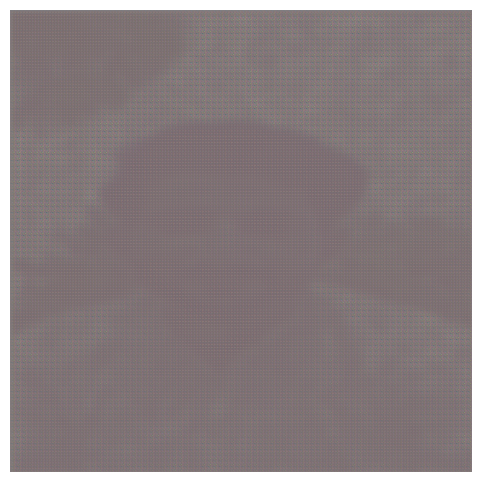

Epoch 201, Gen Loss: 8.4261, Disc Loss: 0.0004, Time: 1.20s
Epoch 202, Gen Loss: 8.8248, Disc Loss: 0.0003, Time: 1.00s
Epoch 203, Gen Loss: 8.4811, Disc Loss: 0.0004, Time: 1.00s
Epoch 204, Gen Loss: 8.7667, Disc Loss: 0.0004, Time: 1.00s
Epoch 205, Gen Loss: 8.6252, Disc Loss: 0.0004, Time: 1.00s
Epoch 206, Gen Loss: 8.2200, Disc Loss: 0.0007, Time: 0.99s
Epoch 207, Gen Loss: 8.2041, Disc Loss: 0.0005, Time: 0.99s
Epoch 208, Gen Loss: 7.5473, Disc Loss: 0.0011, Time: 1.00s
Epoch 209, Gen Loss: 7.4784, Disc Loss: 0.0011, Time: 1.00s
Epoch 210, Gen Loss: 6.9618, Disc Loss: 0.0023, Time: 0.99s
Epoch 211, Gen Loss: 6.7018, Disc Loss: 0.0032, Time: 1.00s
Epoch 212, Gen Loss: 5.5844, Disc Loss: 0.0063, Time: 1.00s
Epoch 213, Gen Loss: 5.9831, Disc Loss: 0.0064, Time: 1.00s
Epoch 214, Gen Loss: 5.9763, Disc Loss: 0.0065, Time: 0.99s
Epoch 215, Gen Loss: 5.6744, Disc Loss: 0.0073, Time: 0.99s
Epoch 216, Gen Loss: 5.6749, Disc Loss: 0.0078, Time: 0.99s
Epoch 217, Gen Loss: 5.6609, Disc Loss: 

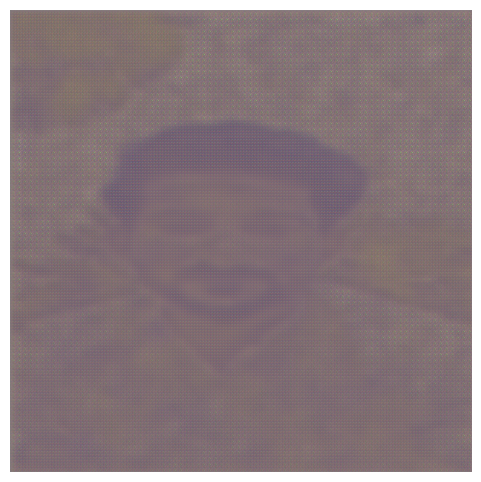

Epoch 251, Gen Loss: 5.7195, Disc Loss: 0.0072, Time: 1.18s
Epoch 252, Gen Loss: 5.5844, Disc Loss: 0.0098, Time: 1.00s
Epoch 253, Gen Loss: 6.0849, Disc Loss: 0.0076, Time: 0.99s
Epoch 254, Gen Loss: 5.5197, Disc Loss: 0.0180, Time: 1.00s
Epoch 255, Gen Loss: 5.6916, Disc Loss: 0.0208, Time: 0.99s
Epoch 256, Gen Loss: 5.3770, Disc Loss: 0.0154, Time: 1.00s
Epoch 257, Gen Loss: 4.9524, Disc Loss: 0.0227, Time: 1.00s
Epoch 258, Gen Loss: 5.1721, Disc Loss: 0.0190, Time: 0.99s
Epoch 259, Gen Loss: 3.7633, Disc Loss: 0.0401, Time: 0.99s
Epoch 260, Gen Loss: 5.7216, Disc Loss: 0.0260, Time: 0.99s
Epoch 261, Gen Loss: 5.3136, Disc Loss: 0.0357, Time: 0.99s
Epoch 262, Gen Loss: 5.4396, Disc Loss: 0.0281, Time: 0.99s
Epoch 263, Gen Loss: 4.6902, Disc Loss: 0.0203, Time: 0.99s
Epoch 264, Gen Loss: 5.1589, Disc Loss: 0.0164, Time: 0.99s
Epoch 265, Gen Loss: 4.4050, Disc Loss: 0.0291, Time: 1.01s
Epoch 266, Gen Loss: 5.1601, Disc Loss: 0.0151, Time: 1.00s
Epoch 267, Gen Loss: 5.1669, Disc Loss: 

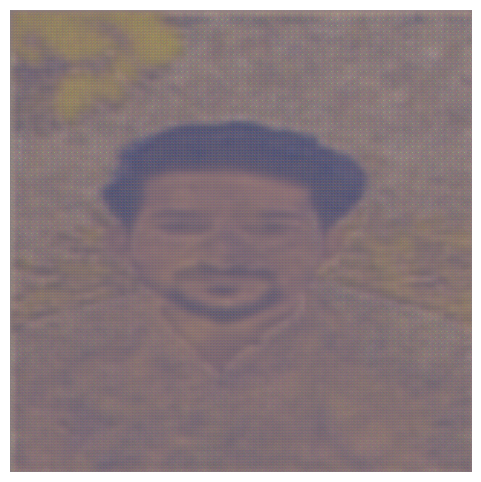

Epoch 301, Gen Loss: 4.7310, Disc Loss: 0.0174, Time: 1.20s
Epoch 302, Gen Loss: 4.8812, Disc Loss: 0.0178, Time: 1.00s
Epoch 303, Gen Loss: 4.3964, Disc Loss: 0.0218, Time: 1.01s
Epoch 304, Gen Loss: 4.6811, Disc Loss: 0.0216, Time: 1.00s
Epoch 305, Gen Loss: 4.9797, Disc Loss: 0.0181, Time: 0.99s
Epoch 306, Gen Loss: 5.2027, Disc Loss: 0.0194, Time: 0.99s
Epoch 307, Gen Loss: 5.1888, Disc Loss: 0.0244, Time: 0.99s
Epoch 308, Gen Loss: 5.7533, Disc Loss: 0.0143, Time: 0.99s
Epoch 309, Gen Loss: 4.6910, Disc Loss: 0.0220, Time: 0.99s
Epoch 310, Gen Loss: 4.7208, Disc Loss: 0.0156, Time: 0.99s
Epoch 311, Gen Loss: 4.7849, Disc Loss: 0.0184, Time: 0.99s
Epoch 312, Gen Loss: 5.2080, Disc Loss: 0.0126, Time: 0.99s
Epoch 313, Gen Loss: 5.8018, Disc Loss: 0.0132, Time: 0.99s
Epoch 314, Gen Loss: 6.0262, Disc Loss: 0.0112, Time: 1.00s
Epoch 315, Gen Loss: 5.8523, Disc Loss: 0.0101, Time: 1.01s
Epoch 316, Gen Loss: 5.3606, Disc Loss: 0.0119, Time: 1.00s
Epoch 317, Gen Loss: 5.7447, Disc Loss: 

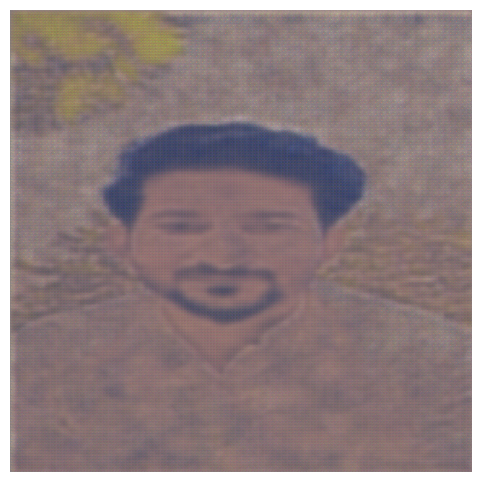

Epoch 351, Gen Loss: 5.8050, Disc Loss: 0.0080, Time: 1.27s
Epoch 352, Gen Loss: 5.8678, Disc Loss: 0.0068, Time: 1.02s
Epoch 353, Gen Loss: 5.4948, Disc Loss: 0.0074, Time: 1.00s
Epoch 354, Gen Loss: 5.8426, Disc Loss: 0.0060, Time: 1.00s
Epoch 355, Gen Loss: 5.6418, Disc Loss: 0.0070, Time: 0.99s
Epoch 356, Gen Loss: 5.7470, Disc Loss: 0.0078, Time: 0.99s
Epoch 357, Gen Loss: 5.8876, Disc Loss: 0.0075, Time: 0.99s
Epoch 358, Gen Loss: 5.7517, Disc Loss: 0.0068, Time: 0.99s
Epoch 359, Gen Loss: 5.5630, Disc Loss: 0.0067, Time: 0.99s
Epoch 360, Gen Loss: 6.1121, Disc Loss: 0.0051, Time: 0.99s
Epoch 361, Gen Loss: 5.5419, Disc Loss: 0.0081, Time: 0.99s
Epoch 362, Gen Loss: 5.8959, Disc Loss: 0.0079, Time: 0.99s
Epoch 363, Gen Loss: 5.9632, Disc Loss: 0.0080, Time: 1.00s
Epoch 364, Gen Loss: 5.7470, Disc Loss: 0.0082, Time: 1.00s
Epoch 365, Gen Loss: 5.7295, Disc Loss: 0.0065, Time: 0.99s
Epoch 366, Gen Loss: 5.6959, Disc Loss: 0.0072, Time: 1.00s
Epoch 367, Gen Loss: 5.3232, Disc Loss: 

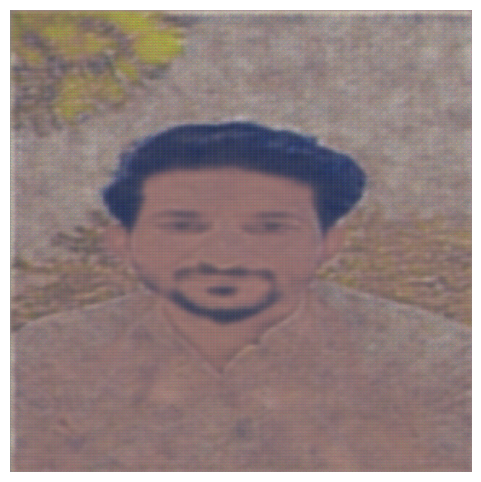

Epoch 401, Gen Loss: 5.9408, Disc Loss: 0.0065, Time: 1.20s
Epoch 402, Gen Loss: 5.6573, Disc Loss: 0.0067, Time: 1.00s
Epoch 403, Gen Loss: 5.5513, Disc Loss: 0.0063, Time: 0.99s
Epoch 404, Gen Loss: 6.1424, Disc Loss: 0.0052, Time: 1.00s
Epoch 405, Gen Loss: 5.7764, Disc Loss: 0.0058, Time: 1.00s
Epoch 406, Gen Loss: 5.7696, Disc Loss: 0.0085, Time: 0.99s
Epoch 407, Gen Loss: 6.0038, Disc Loss: 0.0074, Time: 0.99s
Epoch 408, Gen Loss: 5.6803, Disc Loss: 0.0066, Time: 0.99s
Epoch 409, Gen Loss: 5.9527, Disc Loss: 0.0064, Time: 0.99s
Epoch 410, Gen Loss: 5.9953, Disc Loss: 0.0073, Time: 0.99s
Epoch 411, Gen Loss: 5.9914, Disc Loss: 0.0062, Time: 1.01s
Epoch 412, Gen Loss: 5.6213, Disc Loss: 0.0063, Time: 1.00s
Epoch 413, Gen Loss: 5.5603, Disc Loss: 0.0073, Time: 0.99s
Epoch 414, Gen Loss: 5.5460, Disc Loss: 0.0068, Time: 0.99s
Epoch 415, Gen Loss: 5.4941, Disc Loss: 0.0067, Time: 0.99s
Epoch 416, Gen Loss: 5.3563, Disc Loss: 0.0084, Time: 0.99s
Epoch 417, Gen Loss: 5.8510, Disc Loss: 

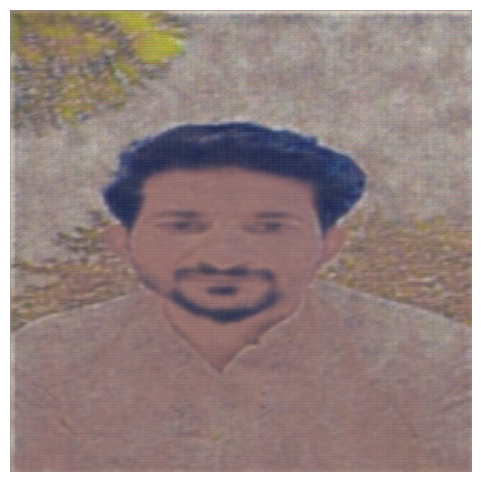

Epoch 451, Gen Loss: 5.7597, Disc Loss: 0.0065, Time: 1.22s
Epoch 452, Gen Loss: 5.6097, Disc Loss: 0.0073, Time: 1.00s
Epoch 453, Gen Loss: 5.7695, Disc Loss: 0.0058, Time: 1.00s
Epoch 454, Gen Loss: 5.6152, Disc Loss: 0.0069, Time: 1.00s
Epoch 455, Gen Loss: 6.0981, Disc Loss: 0.0065, Time: 0.99s
Epoch 456, Gen Loss: 5.7327, Disc Loss: 0.0065, Time: 0.99s
Epoch 457, Gen Loss: 5.9919, Disc Loss: 0.0059, Time: 0.99s
Epoch 458, Gen Loss: 5.7478, Disc Loss: 0.0071, Time: 1.00s
Epoch 459, Gen Loss: 5.8886, Disc Loss: 0.0066, Time: 1.01s
Epoch 460, Gen Loss: 5.8944, Disc Loss: 0.0057, Time: 1.00s
Epoch 461, Gen Loss: 5.6804, Disc Loss: 0.0065, Time: 0.99s
Epoch 462, Gen Loss: 6.0373, Disc Loss: 0.0073, Time: 0.99s
Epoch 463, Gen Loss: 5.8521, Disc Loss: 0.0060, Time: 1.00s
Epoch 464, Gen Loss: 5.9455, Disc Loss: 0.0058, Time: 1.00s
Epoch 465, Gen Loss: 5.7104, Disc Loss: 0.0066, Time: 1.00s
Epoch 466, Gen Loss: 5.9005, Disc Loss: 0.0061, Time: 0.99s
Epoch 467, Gen Loss: 5.6804, Disc Loss: 

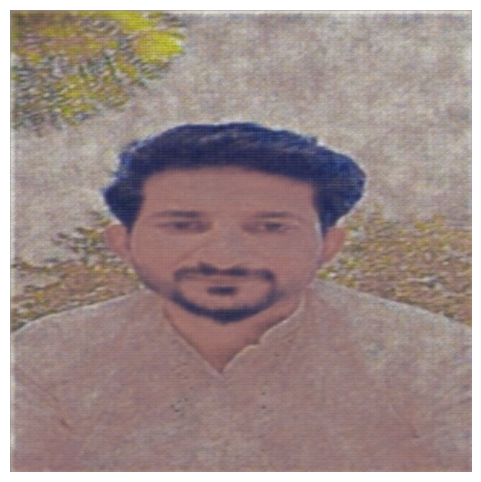

Epoch 501, Gen Loss: 6.3634, Disc Loss: 0.0067, Time: 1.20s
Epoch 502, Gen Loss: 6.7183, Disc Loss: 0.0066, Time: 1.00s
Epoch 503, Gen Loss: 5.7445, Disc Loss: 0.0069, Time: 1.00s
Epoch 504, Gen Loss: 5.7006, Disc Loss: 0.0063, Time: 1.00s
Epoch 505, Gen Loss: 5.6147, Disc Loss: 0.0066, Time: 0.99s
Epoch 506, Gen Loss: 5.5727, Disc Loss: 0.0058, Time: 0.99s
Epoch 507, Gen Loss: 5.3696, Disc Loss: 0.0083, Time: 1.00s
Epoch 508, Gen Loss: 5.9730, Disc Loss: 0.0067, Time: 1.00s
Epoch 509, Gen Loss: 6.1490, Disc Loss: 0.0073, Time: 1.00s
Epoch 510, Gen Loss: 6.2627, Disc Loss: 0.0069, Time: 0.99s
Epoch 511, Gen Loss: 5.7079, Disc Loss: 0.0087, Time: 0.99s
Epoch 512, Gen Loss: 5.9829, Disc Loss: 0.0059, Time: 0.99s
Epoch 513, Gen Loss: 5.6793, Disc Loss: 0.0064, Time: 1.00s
Epoch 514, Gen Loss: 5.4672, Disc Loss: 0.0068, Time: 1.00s
Epoch 515, Gen Loss: 5.3754, Disc Loss: 0.0080, Time: 0.99s
Epoch 516, Gen Loss: 5.8754, Disc Loss: 0.0064, Time: 0.99s
Epoch 517, Gen Loss: 6.0426, Disc Loss: 

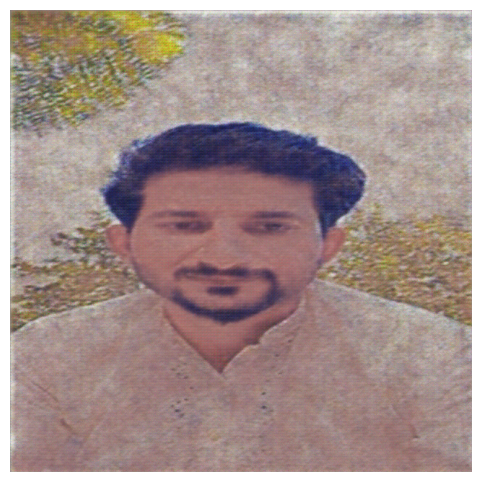

Epoch 551, Gen Loss: 5.4441, Disc Loss: 0.0086, Time: 1.19s
Epoch 552, Gen Loss: 5.6720, Disc Loss: 0.0079, Time: 1.00s
Epoch 553, Gen Loss: 6.2879, Disc Loss: 0.0080, Time: 0.99s
Epoch 554, Gen Loss: 5.6726, Disc Loss: 0.0082, Time: 0.99s
Epoch 555, Gen Loss: 5.6558, Disc Loss: 0.0061, Time: 0.99s
Epoch 556, Gen Loss: 5.7052, Disc Loss: 0.0080, Time: 1.00s
Epoch 557, Gen Loss: 5.7162, Disc Loss: 0.0083, Time: 1.00s
Epoch 558, Gen Loss: 5.7246, Disc Loss: 0.0088, Time: 0.99s
Epoch 559, Gen Loss: 6.6919, Disc Loss: 0.0101, Time: 1.00s
Epoch 560, Gen Loss: 5.6820, Disc Loss: 0.0075, Time: 0.99s
Epoch 561, Gen Loss: 5.1537, Disc Loss: 0.0098, Time: 0.99s
Epoch 562, Gen Loss: 5.5530, Disc Loss: 0.0087, Time: 0.99s
Epoch 563, Gen Loss: 5.7475, Disc Loss: 0.0079, Time: 0.99s
Epoch 564, Gen Loss: 5.7325, Disc Loss: 0.0096, Time: 1.00s
Epoch 565, Gen Loss: 6.1814, Disc Loss: 0.0082, Time: 1.00s
Epoch 566, Gen Loss: 6.2035, Disc Loss: 0.0090, Time: 0.99s
Epoch 567, Gen Loss: 5.7329, Disc Loss: 

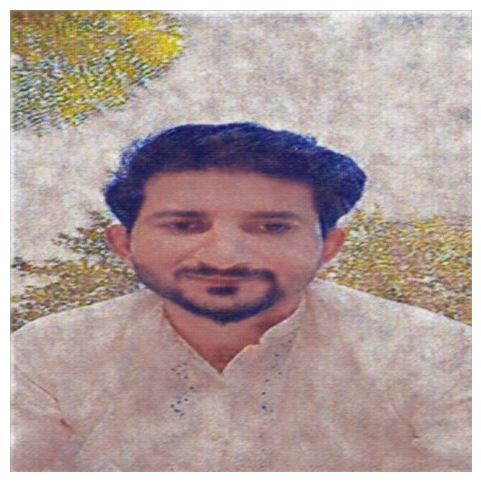

Epoch 601, Gen Loss: 5.3794, Disc Loss: 0.0101, Time: 1.18s
Epoch 602, Gen Loss: 5.6770, Disc Loss: 0.0070, Time: 1.00s
Epoch 603, Gen Loss: 7.0716, Disc Loss: 0.0109, Time: 0.99s
Epoch 604, Gen Loss: 7.0367, Disc Loss: 0.0097, Time: 1.00s
Epoch 605, Gen Loss: 6.0751, Disc Loss: 0.0092, Time: 1.00s
Epoch 606, Gen Loss: 5.2642, Disc Loss: 0.0102, Time: 0.99s
Epoch 607, Gen Loss: 4.7768, Disc Loss: 0.0143, Time: 1.00s
Epoch 608, Gen Loss: 5.8106, Disc Loss: 0.0087, Time: 0.99s
Epoch 609, Gen Loss: 5.9560, Disc Loss: 0.0122, Time: 0.99s
Epoch 610, Gen Loss: 6.6801, Disc Loss: 0.0125, Time: 1.00s
Epoch 611, Gen Loss: 5.9039, Disc Loss: 0.0073, Time: 0.99s
Epoch 612, Gen Loss: 5.1577, Disc Loss: 0.0094, Time: 0.99s
Epoch 613, Gen Loss: 5.9963, Disc Loss: 0.0076, Time: 0.99s
Epoch 614, Gen Loss: 6.4216, Disc Loss: 0.0057, Time: 0.99s
Epoch 615, Gen Loss: 5.4012, Disc Loss: 0.0092, Time: 0.99s
Epoch 616, Gen Loss: 6.2038, Disc Loss: 0.0069, Time: 1.01s
Epoch 617, Gen Loss: 5.9151, Disc Loss: 

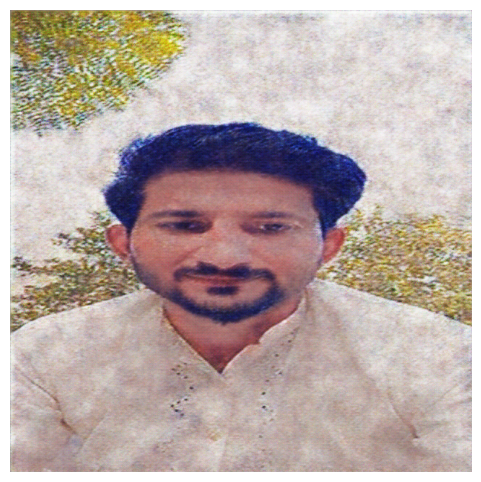

Epoch 651, Gen Loss: 5.6642, Disc Loss: 0.0079, Time: 1.24s
Epoch 652, Gen Loss: 5.7470, Disc Loss: 0.0112, Time: 1.02s
Epoch 653, Gen Loss: 5.8271, Disc Loss: 0.0131, Time: 1.00s
Epoch 654, Gen Loss: 5.4243, Disc Loss: 0.0106, Time: 0.99s
Epoch 655, Gen Loss: 5.3742, Disc Loss: 0.0079, Time: 1.00s
Epoch 656, Gen Loss: 5.2173, Disc Loss: 0.0100, Time: 0.99s
Epoch 657, Gen Loss: 6.1178, Disc Loss: 0.0068, Time: 1.00s
Epoch 658, Gen Loss: 5.7074, Disc Loss: 0.0090, Time: 0.99s
Epoch 659, Gen Loss: 5.7300, Disc Loss: 0.0079, Time: 0.99s
Epoch 660, Gen Loss: 6.0979, Disc Loss: 0.0097, Time: 1.00s
Epoch 661, Gen Loss: 5.3136, Disc Loss: 0.0089, Time: 1.00s
Epoch 662, Gen Loss: 5.2882, Disc Loss: 0.0111, Time: 1.00s
Epoch 663, Gen Loss: 6.0535, Disc Loss: 0.0078, Time: 0.99s
Epoch 664, Gen Loss: 5.6306, Disc Loss: 0.0088, Time: 1.00s
Epoch 665, Gen Loss: 5.8377, Disc Loss: 0.0083, Time: 1.00s
Epoch 666, Gen Loss: 5.5098, Disc Loss: 0.0097, Time: 0.99s
Epoch 667, Gen Loss: 4.9726, Disc Loss: 

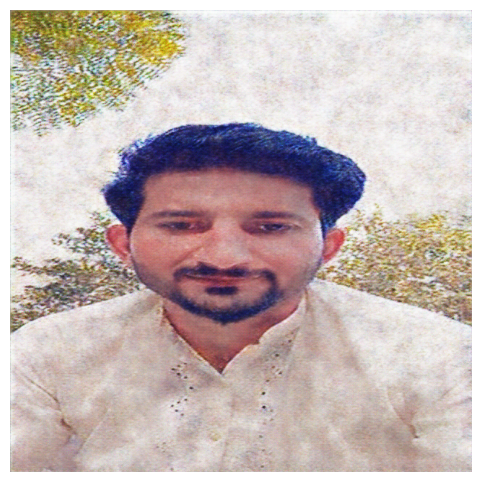

Epoch 701, Gen Loss: 5.3644, Disc Loss: 0.0096, Time: 1.22s
Epoch 702, Gen Loss: 5.6901, Disc Loss: 0.0091, Time: 1.01s
Epoch 703, Gen Loss: 6.2946, Disc Loss: 0.0091, Time: 1.00s
Epoch 704, Gen Loss: 5.6491, Disc Loss: 0.0086, Time: 1.00s
Epoch 705, Gen Loss: 5.2283, Disc Loss: 0.0093, Time: 0.99s
Epoch 706, Gen Loss: 5.4627, Disc Loss: 0.0090, Time: 0.99s
Epoch 707, Gen Loss: 6.2250, Disc Loss: 0.0072, Time: 0.99s
Epoch 708, Gen Loss: 5.5984, Disc Loss: 0.0101, Time: 0.99s
Epoch 709, Gen Loss: 5.7904, Disc Loss: 0.0080, Time: 0.99s
Epoch 710, Gen Loss: 5.4530, Disc Loss: 0.0071, Time: 0.99s
Epoch 711, Gen Loss: 5.5846, Disc Loss: 0.0110, Time: 1.00s
Epoch 712, Gen Loss: 5.7990, Disc Loss: 0.0090, Time: 1.01s
Epoch 713, Gen Loss: 5.4617, Disc Loss: 0.0091, Time: 1.00s
Epoch 714, Gen Loss: 5.9474, Disc Loss: 0.0066, Time: 0.99s
Epoch 715, Gen Loss: 5.8070, Disc Loss: 0.0103, Time: 0.99s
Epoch 716, Gen Loss: 5.5825, Disc Loss: 0.0100, Time: 0.99s
Epoch 717, Gen Loss: 5.6355, Disc Loss: 

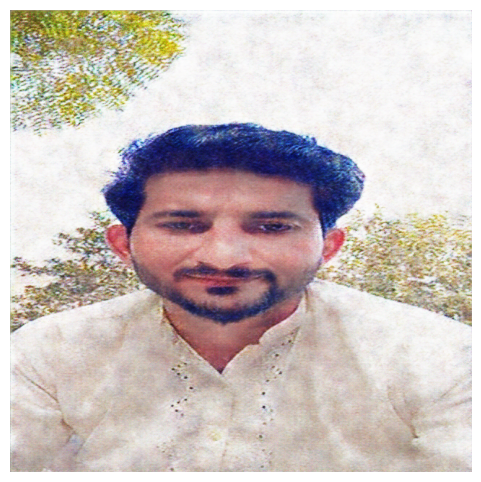

Epoch 751, Gen Loss: 4.9708, Disc Loss: 0.0104, Time: 1.20s
Epoch 752, Gen Loss: 5.5076, Disc Loss: 0.0105, Time: 1.01s
Epoch 753, Gen Loss: 6.3612, Disc Loss: 0.0075, Time: 0.99s
Epoch 754, Gen Loss: 5.9329, Disc Loss: 0.0088, Time: 0.99s
Epoch 755, Gen Loss: 5.4163, Disc Loss: 0.0104, Time: 0.99s
Epoch 756, Gen Loss: 5.5994, Disc Loss: 0.0086, Time: 1.01s
Epoch 757, Gen Loss: 6.1575, Disc Loss: 0.0067, Time: 1.00s
Epoch 758, Gen Loss: 5.4489, Disc Loss: 0.0115, Time: 0.99s
Epoch 759, Gen Loss: 5.8049, Disc Loss: 0.0072, Time: 0.99s
Epoch 760, Gen Loss: 5.6390, Disc Loss: 0.0087, Time: 0.99s
Epoch 761, Gen Loss: 5.9419, Disc Loss: 0.0086, Time: 1.01s
Epoch 762, Gen Loss: 5.5313, Disc Loss: 0.0097, Time: 1.00s
Epoch 763, Gen Loss: 5.3483, Disc Loss: 0.0096, Time: 1.00s
Epoch 764, Gen Loss: 5.5628, Disc Loss: 0.0082, Time: 0.99s
Epoch 765, Gen Loss: 5.9981, Disc Loss: 0.0096, Time: 1.00s
Epoch 766, Gen Loss: 5.7875, Disc Loss: 0.0088, Time: 1.00s
Epoch 767, Gen Loss: 5.3088, Disc Loss: 

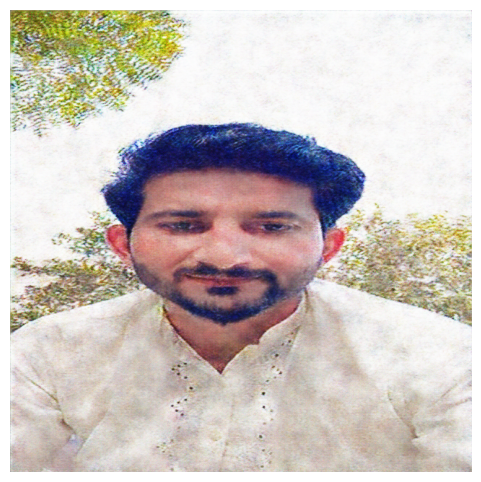

Epoch 801, Gen Loss: 6.2752, Disc Loss: 0.0080, Time: 1.19s
Epoch 802, Gen Loss: 5.1512, Disc Loss: 0.0106, Time: 1.00s
Epoch 803, Gen Loss: 5.2855, Disc Loss: 0.0098, Time: 0.99s
Epoch 804, Gen Loss: 5.6936, Disc Loss: 0.0125, Time: 0.99s
Epoch 805, Gen Loss: 6.0030, Disc Loss: 0.0097, Time: 0.99s
Epoch 806, Gen Loss: 5.2191, Disc Loss: 0.0091, Time: 1.00s
Epoch 807, Gen Loss: 6.0263, Disc Loss: 0.0063, Time: 0.99s
Epoch 808, Gen Loss: 5.5919, Disc Loss: 0.0089, Time: 0.99s
Epoch 809, Gen Loss: 5.6087, Disc Loss: 0.0118, Time: 1.00s
Epoch 810, Gen Loss: 5.4984, Disc Loss: 0.0085, Time: 1.00s
Epoch 811, Gen Loss: 5.3737, Disc Loss: 0.0119, Time: 1.00s
Epoch 812, Gen Loss: 5.8373, Disc Loss: 0.0092, Time: 0.99s
Epoch 813, Gen Loss: 4.9770, Disc Loss: 0.0125, Time: 0.99s
Epoch 814, Gen Loss: 5.5938, Disc Loss: 0.0097, Time: 0.99s
Epoch 815, Gen Loss: 6.1157, Disc Loss: 0.0093, Time: 0.99s
Epoch 816, Gen Loss: 5.7846, Disc Loss: 0.0096, Time: 0.99s
Epoch 817, Gen Loss: 5.5128, Disc Loss: 

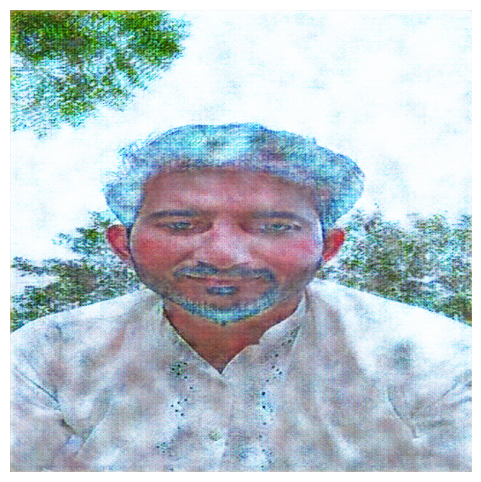

Epoch 851, Gen Loss: 23.5493, Disc Loss: 0.0371, Time: 1.17s
Epoch 852, Gen Loss: 15.1097, Disc Loss: 0.0211, Time: 1.00s
Epoch 853, Gen Loss: 6.9270, Disc Loss: 0.0187, Time: 1.00s
Epoch 854, Gen Loss: 1.4238, Disc Loss: 1.8427, Time: 1.01s
Epoch 855, Gen Loss: 6.9488, Disc Loss: 1.1499, Time: 0.99s
Epoch 856, Gen Loss: 5.1977, Disc Loss: 0.0689, Time: 0.99s
Epoch 857, Gen Loss: 4.8849, Disc Loss: 0.0655, Time: 1.01s
Epoch 858, Gen Loss: 5.6687, Disc Loss: 0.0928, Time: 1.00s
Epoch 859, Gen Loss: 6.5420, Disc Loss: 0.0640, Time: 0.99s
Epoch 860, Gen Loss: 6.8389, Disc Loss: 0.0110, Time: 0.99s
Epoch 861, Gen Loss: 6.2006, Disc Loss: 0.0242, Time: 1.00s
Epoch 862, Gen Loss: 6.6745, Disc Loss: 0.0137, Time: 1.00s
Epoch 863, Gen Loss: 4.8191, Disc Loss: 0.1056, Time: 1.00s
Epoch 864, Gen Loss: 5.0103, Disc Loss: 0.0445, Time: 0.99s
Epoch 865, Gen Loss: 5.1333, Disc Loss: 0.0225, Time: 1.00s
Epoch 866, Gen Loss: 5.6763, Disc Loss: 0.0286, Time: 1.00s
Epoch 867, Gen Loss: 5.3181, Disc Loss

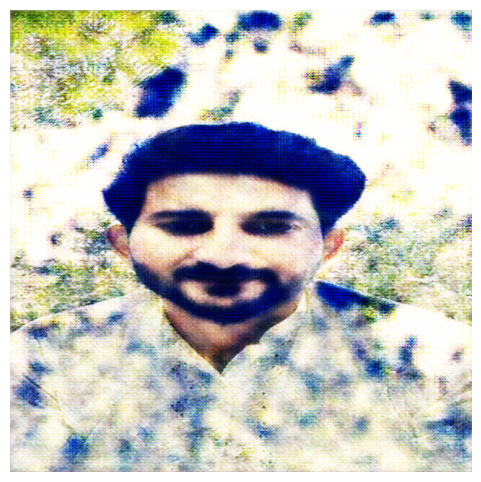

Epoch 901, Gen Loss: 5.2406, Disc Loss: 0.0219, Time: 1.17s
Epoch 902, Gen Loss: 5.4031, Disc Loss: 0.0139, Time: 1.01s
Epoch 903, Gen Loss: 5.5534, Disc Loss: 0.0137, Time: 0.99s
Epoch 904, Gen Loss: 5.4223, Disc Loss: 0.0195, Time: 1.00s
Epoch 905, Gen Loss: 6.4409, Disc Loss: 0.0133, Time: 1.01s
Epoch 906, Gen Loss: 5.7783, Disc Loss: 0.0175, Time: 1.00s
Epoch 907, Gen Loss: 6.3899, Disc Loss: 0.0110, Time: 0.99s
Epoch 908, Gen Loss: 6.6640, Disc Loss: 0.0081, Time: 1.00s
Epoch 909, Gen Loss: 6.7315, Disc Loss: 0.0092, Time: 0.99s
Epoch 910, Gen Loss: 6.0879, Disc Loss: 0.0114, Time: 1.00s
Epoch 911, Gen Loss: 6.1268, Disc Loss: 0.0149, Time: 0.99s
Epoch 912, Gen Loss: 5.6135, Disc Loss: 0.0169, Time: 0.99s
Epoch 913, Gen Loss: 5.6015, Disc Loss: 0.0169, Time: 0.99s
Epoch 914, Gen Loss: 5.3090, Disc Loss: 0.0135, Time: 0.99s
Epoch 915, Gen Loss: 5.6261, Disc Loss: 0.0124, Time: 0.99s
Epoch 916, Gen Loss: 5.4144, Disc Loss: 0.0209, Time: 1.00s
Epoch 917, Gen Loss: 5.9631, Disc Loss: 

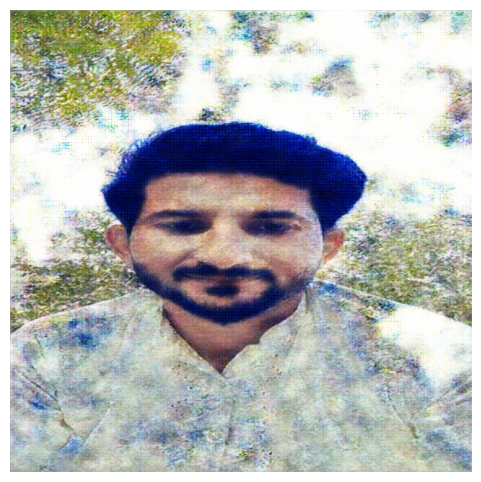

Epoch 951, Gen Loss: 5.6989, Disc Loss: 0.0142, Time: 1.16s
Epoch 952, Gen Loss: 5.5281, Disc Loss: 0.0158, Time: 1.00s
Epoch 953, Gen Loss: 5.1233, Disc Loss: 0.0235, Time: 0.99s
Epoch 954, Gen Loss: 4.6088, Disc Loss: 0.0266, Time: 1.01s
Epoch 955, Gen Loss: 4.5441, Disc Loss: 0.0397, Time: 1.00s
Epoch 956, Gen Loss: 4.7641, Disc Loss: 0.0192, Time: 0.99s
Epoch 957, Gen Loss: 4.7651, Disc Loss: 0.0208, Time: 0.99s
Epoch 958, Gen Loss: 5.2429, Disc Loss: 0.0256, Time: 0.99s
Epoch 959, Gen Loss: 5.3214, Disc Loss: 0.0220, Time: 1.00s
Epoch 960, Gen Loss: 5.0861, Disc Loss: 0.0248, Time: 1.00s
Epoch 961, Gen Loss: 5.0509, Disc Loss: 0.0209, Time: 0.99s
Epoch 962, Gen Loss: 4.9173, Disc Loss: 0.0235, Time: 1.00s
Epoch 963, Gen Loss: 4.9716, Disc Loss: 0.0220, Time: 0.99s
Epoch 964, Gen Loss: 4.9361, Disc Loss: 0.0219, Time: 0.99s
Epoch 965, Gen Loss: 4.6555, Disc Loss: 0.0230, Time: 1.00s
Epoch 966, Gen Loss: 4.3561, Disc Loss: 0.0285, Time: 1.00s
Epoch 967, Gen Loss: 4.8985, Disc Loss: 

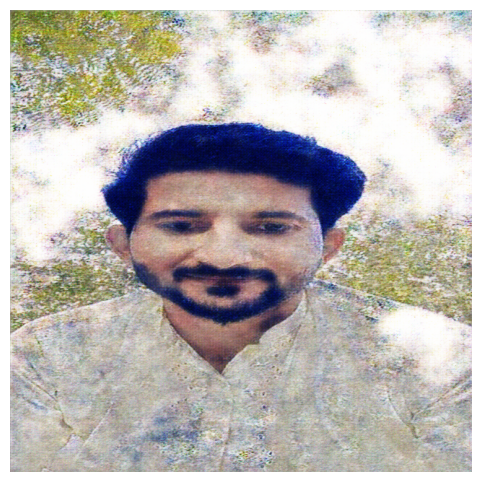

Epoch 1001, Gen Loss: 4.0656, Disc Loss: 0.0248, Time: 1.41s
Epoch 1002, Gen Loss: 4.2261, Disc Loss: 0.0301, Time: 1.00s
Epoch 1003, Gen Loss: 4.3968, Disc Loss: 0.0218, Time: 0.99s
Epoch 1004, Gen Loss: 4.6773, Disc Loss: 0.0223, Time: 1.00s
Epoch 1005, Gen Loss: 4.9549, Disc Loss: 0.0333, Time: 0.99s
Epoch 1006, Gen Loss: 5.1690, Disc Loss: 0.0178, Time: 1.00s
Epoch 1007, Gen Loss: 5.2276, Disc Loss: 0.0162, Time: 0.99s
Epoch 1008, Gen Loss: 5.1107, Disc Loss: 0.0235, Time: 0.99s
Epoch 1009, Gen Loss: 4.9477, Disc Loss: 0.0375, Time: 0.99s
Epoch 1010, Gen Loss: 4.6304, Disc Loss: 0.0276, Time: 0.99s
Epoch 1011, Gen Loss: 4.1004, Disc Loss: 0.0319, Time: 0.99s
Epoch 1012, Gen Loss: 3.9517, Disc Loss: 0.0336, Time: 1.00s
Epoch 1013, Gen Loss: 4.3969, Disc Loss: 0.0253, Time: 1.00s
Epoch 1014, Gen Loss: 4.6192, Disc Loss: 0.0256, Time: 0.99s
Epoch 1015, Gen Loss: 4.9243, Disc Loss: 0.0220, Time: 0.99s
Epoch 1016, Gen Loss: 5.0841, Disc Loss: 0.0244, Time: 0.99s
Epoch 1017, Gen Loss: 5.

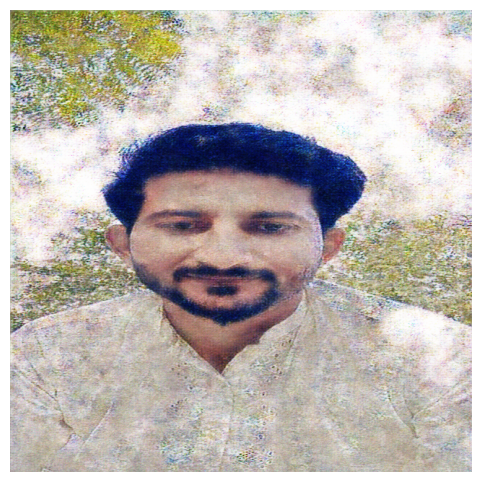

Epoch 1051, Gen Loss: 4.2971, Disc Loss: 0.0240, Time: 1.17s
Epoch 1052, Gen Loss: 4.7976, Disc Loss: 0.0265, Time: 1.00s
Epoch 1053, Gen Loss: 4.4428, Disc Loss: 0.0380, Time: 0.99s
Epoch 1054, Gen Loss: 4.4183, Disc Loss: 0.0274, Time: 1.00s
Epoch 1055, Gen Loss: 4.1414, Disc Loss: 0.0276, Time: 1.00s
Epoch 1056, Gen Loss: 4.3432, Disc Loss: 0.0272, Time: 0.99s
Epoch 1057, Gen Loss: 4.7418, Disc Loss: 0.0310, Time: 0.99s
Epoch 1058, Gen Loss: 4.7185, Disc Loss: 0.0228, Time: 1.00s
Epoch 1059, Gen Loss: 4.6872, Disc Loss: 0.0215, Time: 0.99s
Epoch 1060, Gen Loss: 4.9697, Disc Loss: 0.0260, Time: 1.00s
Epoch 1061, Gen Loss: 4.9553, Disc Loss: 0.0258, Time: 1.00s
Epoch 1062, Gen Loss: 4.6448, Disc Loss: 0.0220, Time: 0.99s
Epoch 1063, Gen Loss: 4.2793, Disc Loss: 0.0269, Time: 1.00s
Epoch 1064, Gen Loss: 4.4828, Disc Loss: 0.0244, Time: 0.99s
Epoch 1065, Gen Loss: 4.5301, Disc Loss: 0.0245, Time: 0.99s
Epoch 1066, Gen Loss: 4.7533, Disc Loss: 0.0242, Time: 0.99s
Epoch 1067, Gen Loss: 4.

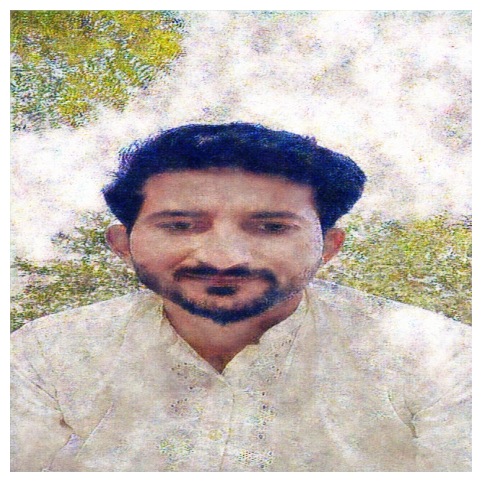

Epoch 1101, Gen Loss: 5.1862, Disc Loss: 0.0224, Time: 1.17s
Epoch 1102, Gen Loss: 5.0961, Disc Loss: 0.0175, Time: 1.01s
Epoch 1103, Gen Loss: 4.8410, Disc Loss: 0.0172, Time: 0.99s
Epoch 1104, Gen Loss: 5.0194, Disc Loss: 0.0190, Time: 0.99s
Epoch 1105, Gen Loss: 4.7189, Disc Loss: 0.0200, Time: 0.99s
Epoch 1106, Gen Loss: 4.7513, Disc Loss: 0.0229, Time: 0.99s
Epoch 1107, Gen Loss: 4.4229, Disc Loss: 0.0252, Time: 0.99s
Epoch 1108, Gen Loss: 4.7915, Disc Loss: 0.0265, Time: 1.01s
Epoch 1109, Gen Loss: 5.0430, Disc Loss: 0.0187, Time: 1.00s
Epoch 1110, Gen Loss: 4.8447, Disc Loss: 0.0236, Time: 0.99s
Epoch 1111, Gen Loss: 4.9688, Disc Loss: 0.0226, Time: 1.00s
Epoch 1112, Gen Loss: 5.3226, Disc Loss: 0.0174, Time: 1.00s
Epoch 1113, Gen Loss: 4.8788, Disc Loss: 0.0174, Time: 1.00s
Epoch 1114, Gen Loss: 4.6658, Disc Loss: 0.0237, Time: 0.99s
Epoch 1115, Gen Loss: 4.7243, Disc Loss: 0.0209, Time: 0.99s
Epoch 1116, Gen Loss: 4.9011, Disc Loss: 0.0136, Time: 0.99s
Epoch 1117, Gen Loss: 4.

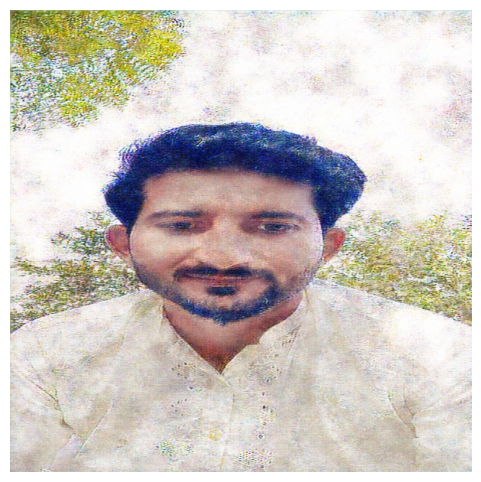

Epoch 1151, Gen Loss: 5.7672, Disc Loss: 0.0255, Time: 1.18s
Epoch 1152, Gen Loss: 5.4762, Disc Loss: 0.0235, Time: 1.00s
Epoch 1153, Gen Loss: 5.5010, Disc Loss: 0.0183, Time: 0.99s
Epoch 1154, Gen Loss: 3.9816, Disc Loss: 0.0370, Time: 0.99s
Epoch 1155, Gen Loss: 4.5866, Disc Loss: 0.0239, Time: 0.99s
Epoch 1156, Gen Loss: 4.5829, Disc Loss: 0.0183, Time: 1.00s
Epoch 1157, Gen Loss: 5.0531, Disc Loss: 0.0372, Time: 1.00s
Epoch 1158, Gen Loss: 5.3075, Disc Loss: 0.0169, Time: 0.99s
Epoch 1159, Gen Loss: 5.1397, Disc Loss: 0.0177, Time: 0.99s
Epoch 1160, Gen Loss: 5.4790, Disc Loss: 0.0135, Time: 0.99s
Epoch 1161, Gen Loss: 4.7614, Disc Loss: 0.0200, Time: 0.99s
Epoch 1162, Gen Loss: 5.2005, Disc Loss: 0.0151, Time: 1.00s
Epoch 1163, Gen Loss: 4.9570, Disc Loss: 0.0225, Time: 0.99s
Epoch 1164, Gen Loss: 5.1064, Disc Loss: 0.0203, Time: 0.99s
Epoch 1165, Gen Loss: 4.8692, Disc Loss: 0.0253, Time: 0.99s
Epoch 1166, Gen Loss: 4.6679, Disc Loss: 0.0187, Time: 1.00s
Epoch 1167, Gen Loss: 5.

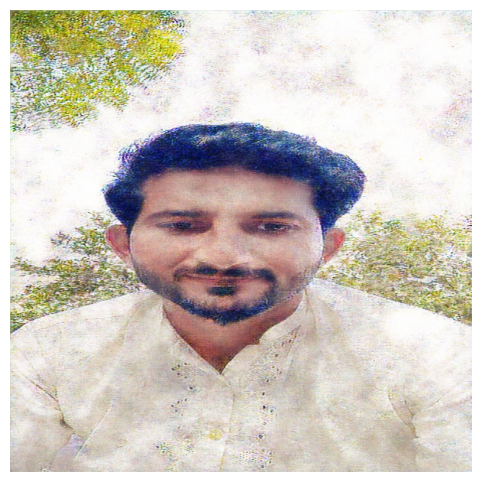

Epoch 1201, Gen Loss: 5.2758, Disc Loss: 0.0168, Time: 1.18s
Epoch 1202, Gen Loss: 4.7876, Disc Loss: 0.0241, Time: 1.01s
Epoch 1203, Gen Loss: 4.4683, Disc Loss: 0.0189, Time: 1.00s
Epoch 1204, Gen Loss: 4.8401, Disc Loss: 0.0218, Time: 1.00s
Epoch 1205, Gen Loss: 4.7179, Disc Loss: 0.0264, Time: 1.01s
Epoch 1206, Gen Loss: 5.6050, Disc Loss: 0.0185, Time: 0.99s
Epoch 1207, Gen Loss: 5.3865, Disc Loss: 0.0161, Time: 0.99s
Epoch 1208, Gen Loss: 4.5260, Disc Loss: 0.0264, Time: 0.99s
Epoch 1209, Gen Loss: 4.6913, Disc Loss: 0.0259, Time: 1.00s
Epoch 1210, Gen Loss: 4.7088, Disc Loss: 0.0230, Time: 0.99s
Epoch 1211, Gen Loss: 4.5191, Disc Loss: 0.0260, Time: 1.00s
Epoch 1212, Gen Loss: 4.8997, Disc Loss: 0.0185, Time: 0.99s
Epoch 1213, Gen Loss: 5.3967, Disc Loss: 0.0181, Time: 1.00s
Epoch 1214, Gen Loss: 4.9164, Disc Loss: 0.0195, Time: 0.99s
Epoch 1215, Gen Loss: 5.1033, Disc Loss: 0.0215, Time: 1.00s
Epoch 1216, Gen Loss: 4.9434, Disc Loss: 0.0186, Time: 1.01s
Epoch 1217, Gen Loss: 4.

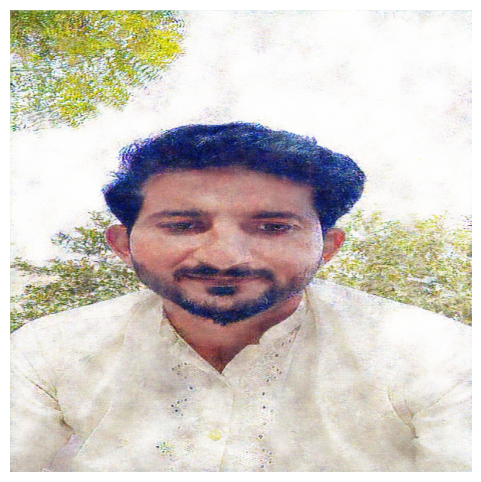

Epoch 1251, Gen Loss: 4.5872, Disc Loss: 0.0174, Time: 1.24s
Epoch 1252, Gen Loss: 5.3495, Disc Loss: 0.0190, Time: 1.01s
Epoch 1253, Gen Loss: 5.6210, Disc Loss: 0.0212, Time: 1.00s
Epoch 1254, Gen Loss: 5.4676, Disc Loss: 0.0242, Time: 1.00s
Epoch 1255, Gen Loss: 4.9092, Disc Loss: 0.0180, Time: 1.00s
Epoch 1256, Gen Loss: 4.3045, Disc Loss: 0.0223, Time: 1.00s
Epoch 1257, Gen Loss: 4.2595, Disc Loss: 0.0220, Time: 1.00s
Epoch 1258, Gen Loss: 4.9626, Disc Loss: 0.0157, Time: 1.00s
Epoch 1259, Gen Loss: 5.7456, Disc Loss: 0.0258, Time: 0.99s
Epoch 1260, Gen Loss: 4.9615, Disc Loss: 0.0263, Time: 1.00s
Epoch 1261, Gen Loss: 4.7200, Disc Loss: 0.0186, Time: 0.99s
Epoch 1262, Gen Loss: 4.7047, Disc Loss: 0.0222, Time: 0.99s
Epoch 1263, Gen Loss: 4.3381, Disc Loss: 0.0224, Time: 0.99s
Epoch 1264, Gen Loss: 4.0109, Disc Loss: 0.0307, Time: 1.00s
Epoch 1265, Gen Loss: 4.6392, Disc Loss: 0.0260, Time: 1.00s
Epoch 1266, Gen Loss: 5.0210, Disc Loss: 0.0185, Time: 0.99s
Epoch 1267, Gen Loss: 5.

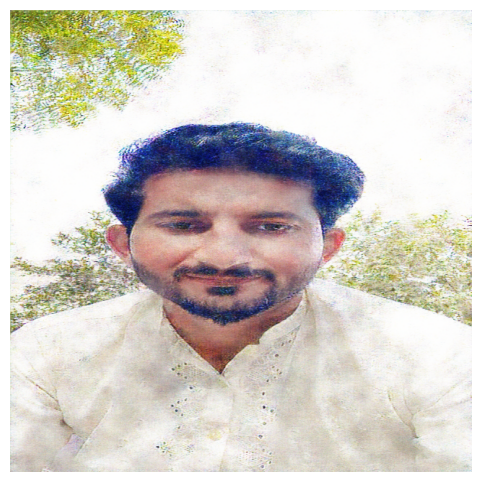

Epoch 1301, Gen Loss: 4.5112, Disc Loss: 0.0205, Time: 1.18s
Epoch 1302, Gen Loss: 4.9041, Disc Loss: 0.0214, Time: 1.00s
Epoch 1303, Gen Loss: 4.9718, Disc Loss: 0.0169, Time: 0.99s
Epoch 1304, Gen Loss: 4.8194, Disc Loss: 0.0179, Time: 0.99s
Epoch 1305, Gen Loss: 5.2738, Disc Loss: 0.0194, Time: 0.99s
Epoch 1306, Gen Loss: 5.3633, Disc Loss: 0.0165, Time: 0.99s
Epoch 1307, Gen Loss: 4.5931, Disc Loss: 0.0189, Time: 0.99s
Epoch 1308, Gen Loss: 4.9117, Disc Loss: 0.0171, Time: 0.99s
Epoch 1309, Gen Loss: 4.7568, Disc Loss: 0.0153, Time: 0.99s
Epoch 1310, Gen Loss: 5.0203, Disc Loss: 0.0157, Time: 0.99s
Epoch 1311, Gen Loss: 5.4231, Disc Loss: 0.0178, Time: 1.00s
Epoch 1312, Gen Loss: 5.0077, Disc Loss: 0.0300, Time: 1.00s
Epoch 1313, Gen Loss: 4.2260, Disc Loss: 0.0197, Time: 1.00s
Epoch 1314, Gen Loss: 4.1573, Disc Loss: 0.0227, Time: 1.00s
Epoch 1315, Gen Loss: 4.3330, Disc Loss: 0.0239, Time: 1.00s
Epoch 1316, Gen Loss: 5.9077, Disc Loss: 0.0239, Time: 0.99s
Epoch 1317, Gen Loss: 6.

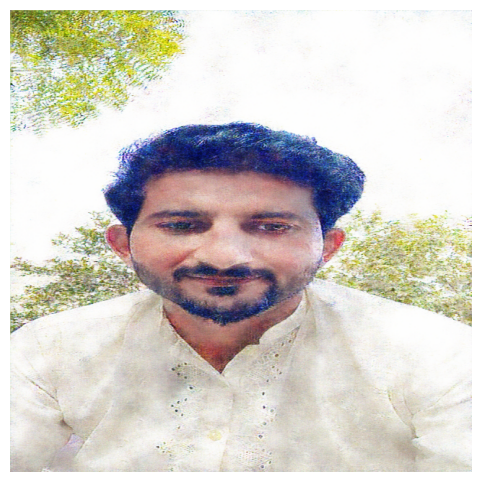

Epoch 1351, Gen Loss: 5.1486, Disc Loss: 0.0125, Time: 1.19s
Epoch 1352, Gen Loss: 5.3429, Disc Loss: 0.0140, Time: 1.00s
Epoch 1353, Gen Loss: 5.6221, Disc Loss: 0.0210, Time: 1.00s
Epoch 1354, Gen Loss: 5.0628, Disc Loss: 0.0123, Time: 1.00s
Epoch 1355, Gen Loss: 4.9190, Disc Loss: 0.0151, Time: 0.99s
Epoch 1356, Gen Loss: 4.9183, Disc Loss: 0.0166, Time: 0.99s
Epoch 1357, Gen Loss: 4.8812, Disc Loss: 0.0197, Time: 1.00s
Epoch 1358, Gen Loss: 4.7714, Disc Loss: 0.0168, Time: 0.99s
Epoch 1359, Gen Loss: 5.0804, Disc Loss: 0.0165, Time: 0.99s
Epoch 1360, Gen Loss: 5.6932, Disc Loss: 0.0142, Time: 1.00s
Epoch 1361, Gen Loss: 5.0525, Disc Loss: 0.0188, Time: 1.00s
Epoch 1362, Gen Loss: 4.7703, Disc Loss: 0.0190, Time: 1.00s
Epoch 1363, Gen Loss: 4.7941, Disc Loss: 0.0142, Time: 0.99s
Epoch 1364, Gen Loss: 4.8761, Disc Loss: 0.0177, Time: 0.99s
Epoch 1365, Gen Loss: 4.9221, Disc Loss: 0.0165, Time: 1.00s
Epoch 1366, Gen Loss: 5.1764, Disc Loss: 0.0138, Time: 0.99s
Epoch 1367, Gen Loss: 5.

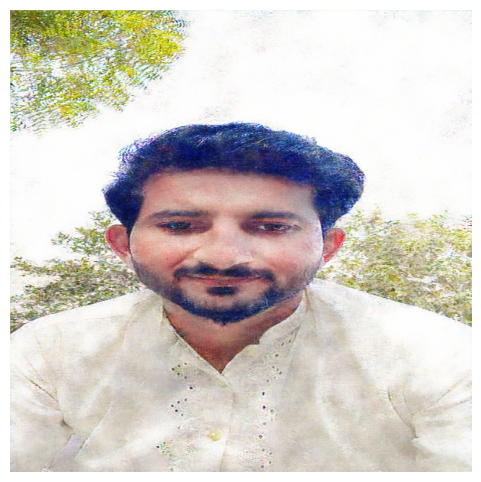

Epoch 1401, Gen Loss: 4.5628, Disc Loss: 0.0171, Time: 1.18s
Epoch 1402, Gen Loss: 4.7164, Disc Loss: 0.0195, Time: 1.00s
Epoch 1403, Gen Loss: 4.8564, Disc Loss: 0.0147, Time: 0.99s
Epoch 1404, Gen Loss: 5.3265, Disc Loss: 0.0147, Time: 0.99s
Epoch 1405, Gen Loss: 5.6110, Disc Loss: 0.0209, Time: 0.99s
Epoch 1406, Gen Loss: 4.9025, Disc Loss: 0.0228, Time: 0.99s
Epoch 1407, Gen Loss: 4.6925, Disc Loss: 0.0171, Time: 0.99s
Epoch 1408, Gen Loss: 4.2128, Disc Loss: 0.0214, Time: 1.00s
Epoch 1409, Gen Loss: 4.5551, Disc Loss: 0.0202, Time: 1.00s
Epoch 1410, Gen Loss: 5.4039, Disc Loss: 0.0173, Time: 1.00s
Epoch 1411, Gen Loss: 6.2365, Disc Loss: 0.0197, Time: 0.99s
Epoch 1412, Gen Loss: 5.6836, Disc Loss: 0.0160, Time: 0.99s
Epoch 1413, Gen Loss: 4.7711, Disc Loss: 0.0189, Time: 1.00s
Epoch 1414, Gen Loss: 4.3903, Disc Loss: 0.0182, Time: 1.00s
Epoch 1415, Gen Loss: 4.7061, Disc Loss: 0.0160, Time: 0.99s
Epoch 1416, Gen Loss: 5.3888, Disc Loss: 0.0166, Time: 0.99s
Epoch 1417, Gen Loss: 5.

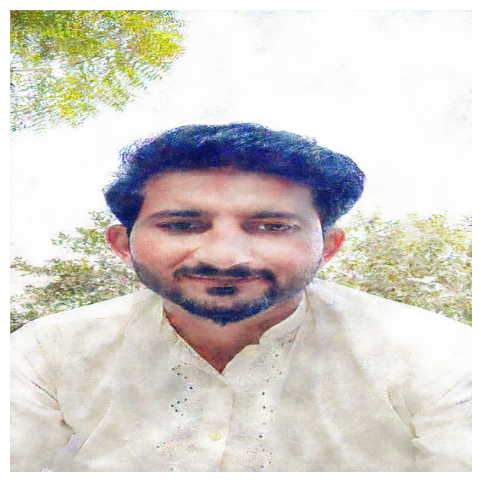

Epoch 1451, Gen Loss: 5.9548, Disc Loss: 0.0210, Time: 1.17s
Epoch 1452, Gen Loss: 5.6037, Disc Loss: 0.0147, Time: 1.01s
Epoch 1453, Gen Loss: 4.5969, Disc Loss: 0.0172, Time: 0.99s
Epoch 1454, Gen Loss: 4.0172, Disc Loss: 0.0248, Time: 0.99s
Epoch 1455, Gen Loss: 4.7378, Disc Loss: 0.0196, Time: 0.99s
Epoch 1456, Gen Loss: 5.2196, Disc Loss: 0.0131, Time: 1.00s
Epoch 1457, Gen Loss: 5.6738, Disc Loss: 0.0270, Time: 1.00s
Epoch 1458, Gen Loss: 4.9828, Disc Loss: 0.0184, Time: 0.99s
Epoch 1459, Gen Loss: 4.4856, Disc Loss: 0.0207, Time: 0.99s
Epoch 1460, Gen Loss: 4.2848, Disc Loss: 0.0185, Time: 0.99s
Epoch 1461, Gen Loss: 5.0746, Disc Loss: 0.0146, Time: 1.00s
Epoch 1462, Gen Loss: 5.4202, Disc Loss: 0.0156, Time: 1.00s
Epoch 1463, Gen Loss: 5.7622, Disc Loss: 0.0176, Time: 0.99s
Epoch 1464, Gen Loss: 5.1005, Disc Loss: 0.0162, Time: 0.99s
Epoch 1465, Gen Loss: 4.5535, Disc Loss: 0.0174, Time: 1.00s
Epoch 1466, Gen Loss: 4.7701, Disc Loss: 0.0153, Time: 0.99s
Epoch 1467, Gen Loss: 4.

In [ ]:
import time

def generate_and_save_images(model, epoch, test_input):
    prediction = model(test_input, training=False)[0]
    prediction_rgb = ((prediction + 1.0) * 127.5).numpy().astype(np.uint8)

    # Sanity check shape
    assert prediction_rgb.shape[-1] == 3, "Output image is not RGB"

    from PIL import Image
    img = Image.fromarray(prediction_rgb)
    os.makedirs("img", exist_ok=True)
    img.save(f"img/image_at_epoch_{epoch:04d}.jpg")

    plt.figure(figsize=(6, 6))
    plt.imshow(prediction_rgb)
    plt.axis('off')
    plt.show()





noise_seed = tf.random.normal([1, 100])

for epoch in range(EPOCHS):
    start = time.time()

    for image_batch in dataset:
        gen_loss, disc_loss = train_step(image_batch)
    if epoch %50==0:
      generate_and_save_images(generator, epoch + 1, noise_seed)
    print(f'Epoch {epoch+1}, Gen Loss: {gen_loss:.4f}, Disc Loss: {disc_loss:.4f}, Time: {time.time()-start:.2f}s')
